## Import Libraries

In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from statsmodels.tsa.arima.model import ARIMA
from sklearn import naive_bayes
from sklearn.linear_model import LogisticRegression
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestRegressor
import warnings
warnings.filterwarnings('ignore')

In [2]:
!pip install xgboost
import xgboost as xgb

## Reading the dataset

In [3]:
df = pd.read_csv('city_day.csv',parse_dates=['Date'])
df.head()

,City,Date,PM2.5,PM10,NO,NO2,NOx,NH3,CO,SO2,O3,Benzene,Toluene,Xylene,AQI,AQI_Bucket
0,Ahmedabad,2015-01-01,NaN,NaN,0.92,18.22,17.15,NaN,0.92,27.64,133.36,0.00,0.02,0.00,NaN,NaN
1,Ahmedabad,2015-01-02,NaN,NaN,0.97,15.69,16.46,NaN,0.97,24.55,34.06,3.68,5.50,3.77,NaN,NaN
2,Ahmedabad,2015-01-03,NaN,NaN,17.40,19.30,29.70,NaN,17.40,29.07,30.70,6.80,16.40,2.25,NaN,NaN
3,Ahmedabad,2015-01-04,NaN,NaN,1.70,18.48,17.97,NaN,1.70,18.59,36.08,4.43,10.14,1.00,NaN,NaN
4,Ahmedabad,2015-01-05,NaN,NaN,22.10,21.42,37.76,NaN,22.10,39.33,39.31,7.01,18.89,2.78,NaN,NaN


In [4]:
df.shape

(29531, 16)

 #### features in dataset:
 'City', 'Date', 'PM2.5'(Particulate matter size 2.5 nano microns)
 'PM10'(Particulate matter size 10 nano microns), 'NO'(Nitrogen Oxide), 'NO2'(Nitrogen Dioxide), 'NOx'(NItric X- Oxide)
 'NH3'(Ammonia), 'CO'(Carbon Monooxide), 'SO2'(Sulphur Dioxide),
 'O3'(Ozone), 'Benzene'(Benzene), 'Toluene', 'Xylene', 'AQI', 'AQI_Bucket'

In [5]:
df.columns

Index(['City', 'Date', 'PM2.5', 'PM10', 'NO', 'NO2', 'NOx', 'NH3', 'CO', 'SO2',
       'O3', 'Benzene', 'Toluene', 'Xylene', 'AQI', 'AQI_Bucket'],
      dtype='object')

# Data Preprocessing

### Handling Null Values

In [6]:
# null value handling
def count_per_null(data):
    nv = data.isnull().sum()
    nv = nv[nv>0]
    nv_df = pd.DataFrame({'Feature':nv.index,'Count_Null':nv.values,
                         'Per_Null':(nv.values/data.shape[0])*100})
    nv_df = nv_df.sort_values('Per_Null', ascending=False)
    return nv_df

In [7]:
nv_df = count_per_null(df)
nv_df

,Feature,Count_Null,Per_Null
11,Xylene,18109,61.322001
1,PM10,11140,37.723071
5,NH3,10328,34.973418
10,Toluene,8041,27.229014
9,Benzene,5623,19.041008
12,AQI,4681,15.851139
13,AQI_Bucket,4681,15.851139
0,PM2.5,4598,15.570079
4,NOx,4185,14.171549
8,O3,4022,13.619586


Inference:
1. Xylene has more than 50% of nulll values
2. Target variable AQI and AQI Bucket also contains null values

In [8]:
df.describe()

,PM2.5,PM10,NO,NO2,NOx,NH3,CO,SO2,O3,Benzene,Toluene,Xylene,AQI
count,24933.000000,18391.000000,25949.000000,25946.000000,25346.000000,19203.000000,27472.000000,25677.000000,25509.000000,23908.000000,21490.000000,11422.000000,24850.000000
mean,67.450578,118.127103,17.574730,28.560659,32.309123,23.483476,2.248598,14.531977,34.491430,3.280840,8.700972,3.070128,166.463581
std,64.661449,90.605110,22.785846,24.474746,31.646011,25.684275,6.962884,18.133775,21.694928,15.811136,19.969164,6.323247,140.696585
min,0.040000,0.010000,0.020000,0.010000,0.000000,0.010000,0.000000,0.010000,0.010000,0.000000,0.000000,0.000000,13.000000
25%,28.820000,56.255000,5.630000,11.750000,12.820000,8.580000,0.510000,5.670000,18.860000,0.120000,0.600000,0.140000,81.000000
50%,48.570000,95.680000,9.890000,21.690000,23.520000,15.850000,0.890000,9.160000,30.840000,1.070000,2.970000,0.980000,118.000000
75%,80.590000,149.745000,19.950000,37.620000,40.127500,30.020000,1.450000,15.220000,45.570000,3.080000,9.150000,3.350000,208.000000
max,949.990000,1000.000000,390.680000,362.210000,467.630000,352.890000,175.810000,193.860000,257.730000,455.030000,454.850000,170.370000,2049.000000


In [9]:
df.dtypes

City                  object
Date          datetime64[ns]
PM2.5                float64
PM10                 float64
NO                   float64
NO2                  float64
NOx                  float64
NH3                  float64
CO                   float64
SO2                  float64
O3                   float64
Benzene              float64
Toluene              float64
Xylene               float64
AQI                  float64
AQI_Bucket            object
dtype: object

In [10]:
#setting date column as index
df.set_index('Date',inplace=True)
df.head()

,City,PM2.5,PM10,NO,NO2,NOx,NH3,CO,SO2,O3,Benzene,Toluene,Xylene,AQI,AQI_Bucket
Date,,,,,,,,,,,,,,,
2015-01-01,Ahmedabad,NaN,NaN,0.92,18.22,17.15,NaN,0.92,27.64,133.36,0.00,0.02,0.00,NaN,NaN
2015-01-02,Ahmedabad,NaN,NaN,0.97,15.69,16.46,NaN,0.97,24.55,34.06,3.68,5.50,3.77,NaN,NaN
2015-01-03,Ahmedabad,NaN,NaN,17.40,19.30,29.70,NaN,17.40,29.07,30.70,6.80,16.40,2.25,NaN,NaN
2015-01-04,Ahmedabad,NaN,NaN,1.70,18.48,17.97,NaN,1.70,18.59,36.08,4.43,10.14,1.00,NaN,NaN
2015-01-05,Ahmedabad,NaN,NaN,22.10,21.42,37.76,NaN,22.10,39.33,39.31,7.01,18.89,2.78,NaN,NaN


In [11]:
df.columns

Index(['City', 'PM2.5', 'PM10', 'NO', 'NO2', 'NOx', 'NH3', 'CO', 'SO2', 'O3',
       'Benzene', 'Toluene', 'Xylene', 'AQI', 'AQI_Bucket'],
      dtype='object')

### Filling the Nan Values present in the pollutants with median(city wise)

In [12]:
df.iloc[:,1:13]=df.groupby("City").transform(lambda x: x.fillna(x.median()))

In [13]:
nv_df1 = count_per_null(df)
nv_df1

,Feature,Count_Null,Per_Null
6,Xylene,13047,44.180691
7,AQI,4681,15.851139
8,AQI_Bucket,4681,15.851139
5,Toluene,4010,13.578951
4,Benzene,2732,9.251295
0,PM10,2009,6.803021
2,NH3,2009,6.803021
1,NOx,1169,3.958552
3,O3,162,0.548576


inference:
1. still there are null values because it might happen that the column data must be unavailable for some cities entirely

In [14]:
df.head()

,City,PM2.5,PM10,NO,NO2,NOx,NH3,CO,SO2,O3,Benzene,Toluene,Xylene,AQI,AQI_Bucket
Date,,,,,,,,,,,,,,,
2015-01-01,Ahmedabad,58.37,107.96,0.92,18.22,17.15,NaN,0.92,27.64,133.36,0.00,0.02,0.00,NaN,NaN
2015-01-02,Ahmedabad,58.37,107.96,0.97,15.69,16.46,NaN,0.97,24.55,34.06,3.68,5.50,3.77,NaN,NaN
2015-01-03,Ahmedabad,58.37,107.96,17.40,19.30,29.70,NaN,17.40,29.07,30.70,6.80,16.40,2.25,NaN,NaN
2015-01-04,Ahmedabad,58.37,107.96,1.70,18.48,17.97,NaN,1.70,18.59,36.08,4.43,10.14,1.00,NaN,NaN
2015-01-05,Ahmedabad,58.37,107.96,22.10,21.42,37.76,NaN,22.10,39.33,39.31,7.01,18.89,2.78,NaN,NaN


In [15]:
df['City'].value_counts(sort=False).index.values

array(['Ahmedabad', 'Aizawl', 'Amaravati', 'Amritsar', 'Bengaluru',
       'Bhopal', 'Brajrajnagar', 'Chandigarh', 'Chennai', 'Coimbatore',
       'Delhi', 'Ernakulam', 'Gurugram', 'Guwahati', 'Hyderabad',
       'Jaipur', 'Jorapokhar', 'Kochi', 'Kolkata', 'Lucknow', 'Mumbai',
       'Patna', 'Shillong', 'Talcher', 'Thiruvananthapuram',
       'Visakhapatnam'], dtype=object)

In [16]:
for i in df['City'].value_counts(sort=False).index.values:
    df_i=df[df['City']==i]
    print(i)
    print(count_per_null(df_i))

Ahmedabad
      Feature  Count_Null    Per_Null
0         NH3        2009  100.000000
1         AQI         675   33.598805
2  AQI_Bucket         675   33.598805
Aizawl
      Feature  Count_Null    Per_Null
0      Xylene         113  100.000000
1         AQI           2    1.769912
2  AQI_Bucket           2    1.769912
Amaravati
      Feature  Count_Null   Per_Null
0         AQI         110  11.566772
1  AQI_Bucket         110  11.566772
Amritsar
      Feature  Count_Null  Per_Null
0         AQI          95  7.780508
1  AQI_Bucket          95  7.780508
Bengaluru
      Feature  Count_Null    Per_Null
0      Xylene        2009  100.000000
1         AQI          99    4.927825
2  AQI_Bucket          99    4.927825
Bhopal
      Feature  Count_Null    Per_Null
0     Benzene         289  100.000000
1     Toluene         289  100.000000
2      Xylene         289  100.000000
3         AQI          11    3.806228
4  AQI_Bucket          11    3.806228
Brajrajnagar
      Feature  Count_Null    Pe

<Axes: ylabel='Date'>

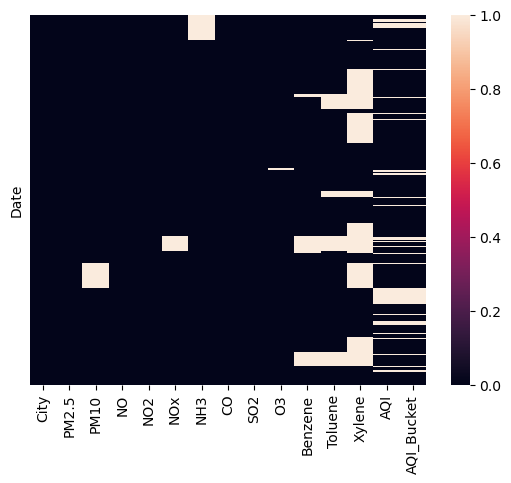

In [17]:
sns.heatmap(df.isnull(),yticklabels=False)

#### Handling left over null values in each city
1. Droping xylene as most of the CITIES have no record of xylene like Aizwal, Bengaluru, Bhopal, Brajrajnagar, Chennai,Coimbatore, Guwahati, Jaipur, Jorapokhar, Kochi, Lucknow, Shillong, Talcher, Thiruvanantpuram

In [18]:
df.drop('Xylene',axis=1,inplace=True)


In [19]:
df.head()

,City,PM2.5,PM10,NO,NO2,NOx,NH3,CO,SO2,O3,Benzene,Toluene,AQI,AQI_Bucket
Date,,,,,,,,,,,,,,
2015-01-01,Ahmedabad,58.37,107.96,0.92,18.22,17.15,NaN,0.92,27.64,133.36,0.00,0.02,NaN,NaN
2015-01-02,Ahmedabad,58.37,107.96,0.97,15.69,16.46,NaN,0.97,24.55,34.06,3.68,5.50,NaN,NaN
2015-01-03,Ahmedabad,58.37,107.96,17.40,19.30,29.70,NaN,17.40,29.07,30.70,6.80,16.40,NaN,NaN
2015-01-04,Ahmedabad,58.37,107.96,1.70,18.48,17.97,NaN,1.70,18.59,36.08,4.43,10.14,NaN,NaN
2015-01-05,Ahmedabad,58.37,107.96,22.10,21.42,37.76,NaN,22.10,39.33,39.31,7.01,18.89,NaN,NaN


In [20]:
df.shape

(29531, 14)

In [21]:
df.describe()

,PM2.5,PM10,NO,NO2,NOx,NH3,CO,SO2,O3,Benzene,Toluene,AQI
count,29531.000000,27522.000000,29531.000000,29531.000000,28362.000000,27522.000000,29531.000000,29531.000000,29369.000000,26799.000000,25521.000000,24850.000000
mean,64.495018,112.321444,17.586426,28.038496,32.045347,22.317420,2.469716,15.120249,33.817075,3.069090,7.973057,166.463581
std,60.418818,77.661482,21.513692,23.404976,30.101181,22.208817,7.014473,17.676906,20.499507,14.953885,18.640927,140.696585
min,0.040000,0.010000,0.020000,0.010000,0.000000,0.010000,0.000000,0.010000,0.010000,0.000000,0.000000,13.000000
25%,28.080000,59.960000,6.100000,12.080000,13.980000,10.330000,0.510000,6.050000,19.890000,0.120000,0.310000,81.000000
50%,48.170000,100.685000,10.580000,21.460000,24.290000,14.500000,0.900000,9.900000,29.620000,1.020000,2.650000,118.000000
75%,76.345000,130.060000,22.220000,36.650000,39.510000,28.787500,1.500000,15.600000,43.160000,3.090000,8.190000,208.000000
max,949.990000,1000.000000,390.680000,362.210000,467.630000,352.890000,175.810000,193.860000,257.730000,455.030000,454.850000,2049.000000


2. nh3 levels in ahmedabad can be filled with median of the entire nations ammonia levels as it is a logical middle value
3. benzene levels in Bhopal, Jorapokhar and thiruvantpuram can be filled with mean as national levels are near average
4. Toluene levels in bhopal, brajrajnagar,Guwahati,Jorapokhar and Thiruvananatpuram can be filled with median with is closer to normal average toluene levels of India
5. O3 levels in Ernakulam can be filled with median as it correlates to the usual ozone level of that region
6. NOX in Jorapokhar can be filled by mean as its a mining city with comparitive higher range of nox than normal to other cities.
7. PM10 in Lucknow can be replaced by mean as Lucknow is a big city with usual than higher rates of pm10


In [22]:
for i in df[['NH3']]:
    df[i] = df[i].fillna(df[i].median())

In [23]:
for i in df[['Benzene']]:
    df[i] = df[i].fillna(df[i].mean())

In [24]:
for i in df[['Toluene']]:
    df[i] = df[i].fillna(df[i].median())

In [25]:
for i in df[['O3']]:
    df[i] = df[i].fillna(df[i].median())

In [26]:
for i in df[['NOx']]:
    df[i] = df[i].fillna(df[i].mean())

In [27]:
for i in df[['PM10']]:
    df[i] = df[i].fillna(df[i].mean())

In [28]:
count_per_null(df)

,Feature,Count_Null,Per_Null
0,AQI,4681,15.851139
1,AQI_Bucket,4681,15.851139


### The AQI calculation uses 7 measures: PM2.5, PM10, SO2, NOx, NH3, CO and O3.
-->For PM2.5, PM10, SO2, NOx and NH3 the average value in last 24-hrs is used with the condition of having at least 16 values.

-->For CO and O3 the maximum value in last 8-hrs is used.

-->Each measure is converted into a Sub-Index based on pre-defined groups.

-->Sometimes measures are not available due to lack of measuring or lack of required data points.

-->Final AQI is the maximum Sub-Index with the condition that at least one of PM2.5 and PM10 should be available and at least three out of the seven should be available

-->Benezene and Toluene are hazardous to health but there quantity is usually avoided in calculating aqi 

In [29]:
# ------------- FORMULA IMPORTED FROM CPCP WEBSITE----------------
# PM10 Sub-Index calculation
def get_PM10_subindex(x):
    if x <= 50:
        return x
    elif x > 50 and x <= 100:
        return x
    elif x > 100 and x <= 250:
        return 100 + (x - 100) * 100 / 150
    elif x > 250 and x <= 350:
        return 200 + (x - 250)
    elif x > 350 and x <= 430:
        return 300 + (x - 350) * 100 / 80
    elif x > 430:
        return 400 + (x - 430) * 100 / 80
    else:
        return 0

df["PM10_SubIndex"] = df["PM10"].astype(int).apply(lambda x: get_PM10_subindex(x))
    
# PM2.5 Sub-Index calculation
def get_PM25_subindex(x):
    if x <= 30:
        return x * 50 / 30
    elif x > 30 and x <= 60:
        return 50 + (x - 30) * 50 / 30
    elif x > 60 and x <= 90:
        return 100 + (x - 60) * 100 / 30
    elif x > 90 and x <= 120:
        return 200 + (x - 90) * 100 / 30
    elif x > 120 and x <= 250:
        return 300 + (x - 120) * 100 / 130
    elif x > 250:
        return 400 + (x - 250) * 100 / 130
    else:
        return 0

df["PM2.5_SubIndex"] = df["PM2.5"].astype(int).apply(lambda x: get_PM25_subindex(x))


# SO2 Sub-Index calculation
def get_SO2_subindex(x):
    if x <= 40:
        return x * 50 / 40
    elif x > 40 and x <= 80:
        return 50 + (x - 40) * 50 / 40
    elif x > 80 and x <= 380:
        return 100 + (x - 80) * 100 / 300
    elif x > 380 and x <= 800:
        return 200 + (x - 380) * 100 / 420
    elif x > 800 and x <= 1600:
        return 300 + (x - 800) * 100 / 800
    elif x > 1600:
        return 400 + (x - 1600) * 100 / 800
    else:
        return 0

df["SO2_SubIndex"] = df["SO2"].astype(int).apply(lambda x: get_SO2_subindex(x))

# NOx Sub-Index calculation
def get_NOx_subindex(x):
    if x <= 40:
        return x * 50 / 40
    elif x > 40 and x <= 80:
        return 50 + (x - 40) * 50 / 40
    elif x > 80 and x <= 180:
        return 100 + (x - 80) * 100 / 100
    elif x > 180 and x <= 280:
        return 200 + (x - 180) * 100 / 100
    elif x > 280 and x <= 400:
        return 300 + (x - 280) * 100 / 120
    elif x > 400:
        return 400 + (x - 400) * 100 / 120
    else:
        return 0

df["NOx_SubIndex"] = df["NOx"].astype(int).apply(lambda x: get_NOx_subindex(x))

# NH3 Sub-Index calculation
def get_NH3_subindex(x):
    if x <= 200:
        return x * 50 / 200
    elif x > 200 and x <= 400:
        return 50 + (x - 200) * 50 / 200
    elif x > 400 and x <= 800:
        return 100 + (x - 400) * 100 / 400
    elif x > 800 and x <= 1200:
        return 200 + (x - 800) * 100 / 400
    elif x > 1200 and x <= 1800:
        return 300 + (x - 1200) * 100 / 600
    elif x > 1800:
        return 400 + (x - 1800) * 100 / 600
    else:
        return 0

df["NH3_SubIndex"] = df["NH3"].astype(int).apply(lambda x: get_NH3_subindex(x))

# CO Sub-Index calculation
def get_CO_subindex(x):
    if x <= 1:
        return x * 50 / 1
    elif x > 1 and x <= 2:
        return 50 + (x - 1) * 50 / 1
    elif x > 2 and x <= 10:
        return 100 + (x - 2) * 100 / 8
    elif x > 10 and x <= 17:
        return 200 + (x - 10) * 100 / 7
    elif x > 17 and x <= 34:
        return 300 + (x - 17) * 100 / 17
    elif x > 34:
        return 400 + (x - 34) * 100 / 17
    else:
        return 0

df["CO_SubIndex"] = df["CO"].astype(int).apply(lambda x: get_CO_subindex(x))

# O3 Sub-Index calculation
def get_O3_subindex(x):
    if x <= 50:
        return x * 50 / 50
    elif x > 50 and x <= 100:
        return 50 + (x - 50) * 50 / 50
    elif x > 100 and x <= 168:
        return 100 + (x - 100) * 100 / 68
    elif x > 168 and x <= 208:
        return 200 + (x - 168) * 100 / 40
    elif x > 208 and x <= 748:
        return 300 + (x - 208) * 100 / 539
    elif x > 748:
        return 400 + (x - 400) * 100 / 539
    else:
        return 0

df["O3_SubIndex"] = df["O3"].astype(int).apply(lambda x: get_O3_subindex(x))

### Filling the Nan values of AQI column by taking maximum values out of sub-Indexes

In [30]:
df["AQI"] = df["AQI"].fillna(round(df[["PM2.5_SubIndex", "PM10_SubIndex", "SO2_SubIndex", "NOx_SubIndex","NH3_SubIndex","CO_SubIndex","O3_SubIndex"]].max(axis = 1)))

In [31]:
df.head()

,City,PM2.5,PM10,NO,NO2,NOx,NH3,CO,SO2,O3,...,Toluene,AQI,AQI_Bucket,PM10_SubIndex,PM2.5_SubIndex,SO2_SubIndex,NOx_SubIndex,NH3_SubIndex,CO_SubIndex,O3_SubIndex
Date,,,,,,,,,,,,,,,,,,,,,
2015-01-01,Ahmedabad,58.37,107.96,0.92,18.22,17.15,14.5,0.92,27.64,133.36,...,0.02,149.0,NaN,104.666667,96.666667,33.75,21.25,3.5,0.000000,148.529412
2015-01-02,Ahmedabad,58.37,107.96,0.97,15.69,16.46,14.5,0.97,24.55,34.06,...,5.50,105.0,NaN,104.666667,96.666667,30.00,20.00,3.5,0.000000,34.000000
2015-01-03,Ahmedabad,58.37,107.96,17.40,19.30,29.70,14.5,17.40,29.07,30.70,...,16.40,300.0,NaN,104.666667,96.666667,36.25,36.25,3.5,300.000000,30.000000
2015-01-04,Ahmedabad,58.37,107.96,1.70,18.48,17.97,14.5,1.70,18.59,36.08,...,10.14,105.0,NaN,104.666667,96.666667,22.50,21.25,3.5,50.000000,36.000000
2015-01-05,Ahmedabad,58.37,107.96,22.10,21.42,37.76,14.5,22.10,39.33,39.31,...,18.89,329.0,NaN,104.666667,96.666667,48.75,46.25,3.5,329.411765,39.000000


### Calculating AQI bucket and filling the NAN value present by AQI levels

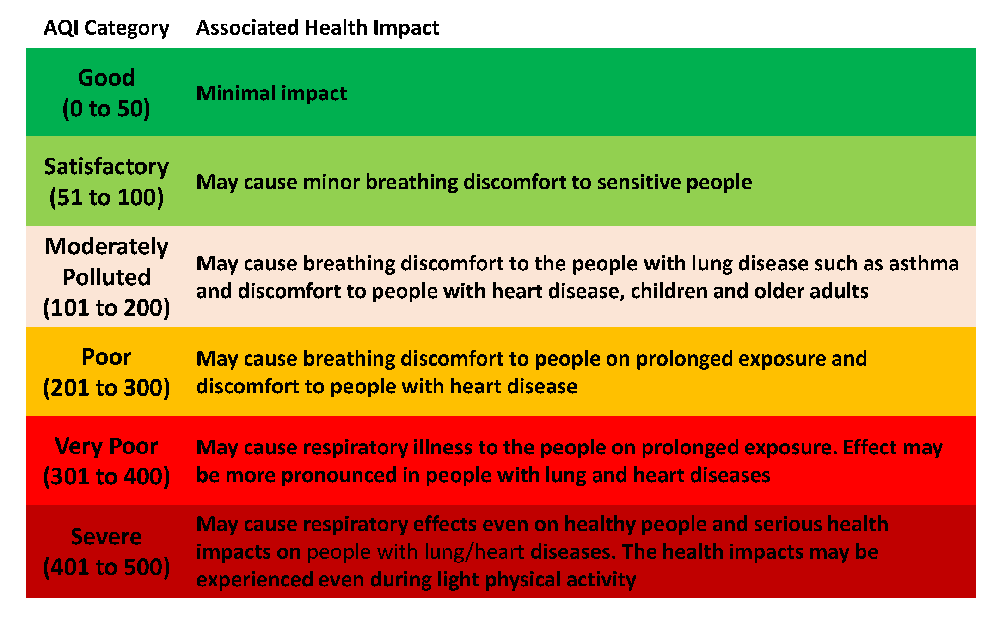

In [32]:
from IPython import display 
display.Image("AQI LEVELS.png",width = 400, height = 200)

In [33]:
## AQI bucketing
def get_AQI_bucket(x):
    if x <= 50:
        return "Good"
    elif x > 50 and x <= 100:
        return "Satisfactory"
    elif x > 100 and x <= 200:
        return "Moderate"
    elif x > 200 and x <= 300:
        return "Poor"
    elif x > 300 and x <= 400:
        return "Very Poor"
    elif x > 400:
        return "Severe"
    else:
        return '0'
    
df["AQI_Bucket"] = df["AQI_Bucket"].fillna(df["AQI"].apply(lambda x: get_AQI_bucket(x)))

In [34]:
count_per_null(df)

,Feature,Count_Null,Per_Null


finally there are no null values in data set

### Dropping extra sub index columns

In [35]:
# "PM2.5_SubIndex", "PM10_SubIndex", "SO2_SubIndex", "NOx_SubIndex","NH3_SubIndex","CO_SubIndex","O3_SubIndex"
df.drop('PM2.5_SubIndex',axis=1,inplace=True)
df.drop('PM10_SubIndex',axis=1,inplace=True)
df.drop('SO2_SubIndex',axis=1,inplace=True)
df.drop('NOx_SubIndex',axis=1,inplace=True)
df.drop('NH3_SubIndex',axis=1,inplace=True)
df.drop('CO_SubIndex',axis=1,inplace=True)
df.drop('O3_SubIndex',axis=1,inplace=True)

In [36]:
df.columns

Index(['City', 'PM2.5', 'PM10', 'NO', 'NO2', 'NOx', 'NH3', 'CO', 'SO2', 'O3',
       'Benzene', 'Toluene', 'AQI', 'AQI_Bucket'],
      dtype='object')

In [37]:
df=df.reset_index()
df.head()

,Date,City,PM2.5,PM10,NO,NO2,NOx,NH3,CO,SO2,O3,Benzene,Toluene,AQI,AQI_Bucket
0,2015-01-01,Ahmedabad,58.37,107.96,0.92,18.22,17.15,14.5,0.92,27.64,133.36,0.00,0.02,149.0,Moderate
1,2015-01-02,Ahmedabad,58.37,107.96,0.97,15.69,16.46,14.5,0.97,24.55,34.06,3.68,5.50,105.0,Moderate
2,2015-01-03,Ahmedabad,58.37,107.96,17.40,19.30,29.70,14.5,17.40,29.07,30.70,6.80,16.40,300.0,Poor
3,2015-01-04,Ahmedabad,58.37,107.96,1.70,18.48,17.97,14.5,1.70,18.59,36.08,4.43,10.14,105.0,Moderate
4,2015-01-05,Ahmedabad,58.37,107.96,22.10,21.42,37.76,14.5,22.10,39.33,39.31,7.01,18.89,329.0,Very Poor


In [38]:
# # Durbin Wason Test - For checking Auto correlation in database
# from statsmodels.stats.stattools import durbin_watson
#df.drop('index',axis=1,inplace=True)

In [39]:
df.head()

,Date,City,PM2.5,PM10,NO,NO2,NOx,NH3,CO,SO2,O3,Benzene,Toluene,AQI,AQI_Bucket
0,2015-01-01,Ahmedabad,58.37,107.96,0.92,18.22,17.15,14.5,0.92,27.64,133.36,0.00,0.02,149.0,Moderate
1,2015-01-02,Ahmedabad,58.37,107.96,0.97,15.69,16.46,14.5,0.97,24.55,34.06,3.68,5.50,105.0,Moderate
2,2015-01-03,Ahmedabad,58.37,107.96,17.40,19.30,29.70,14.5,17.40,29.07,30.70,6.80,16.40,300.0,Poor
3,2015-01-04,Ahmedabad,58.37,107.96,1.70,18.48,17.97,14.5,1.70,18.59,36.08,4.43,10.14,105.0,Moderate
4,2015-01-05,Ahmedabad,58.37,107.96,22.10,21.42,37.76,14.5,22.10,39.33,39.31,7.01,18.89,329.0,Very Poor


### Handling Duplicates

In [40]:
df.duplicated().sum()

0

## EXPLORATORY DATA ANALYSIS

In [41]:
df_city_day = df.copy()
pollutants = ['PM2.5', 'PM10', 'NO', 'NO2', 'NOx', 'NH3', 'CO', 'SO2','O3', 'Benzene', 'Toluene']
df_city_day = df_city_day[pollutants]

Distribution of different pollutants in 2015-202


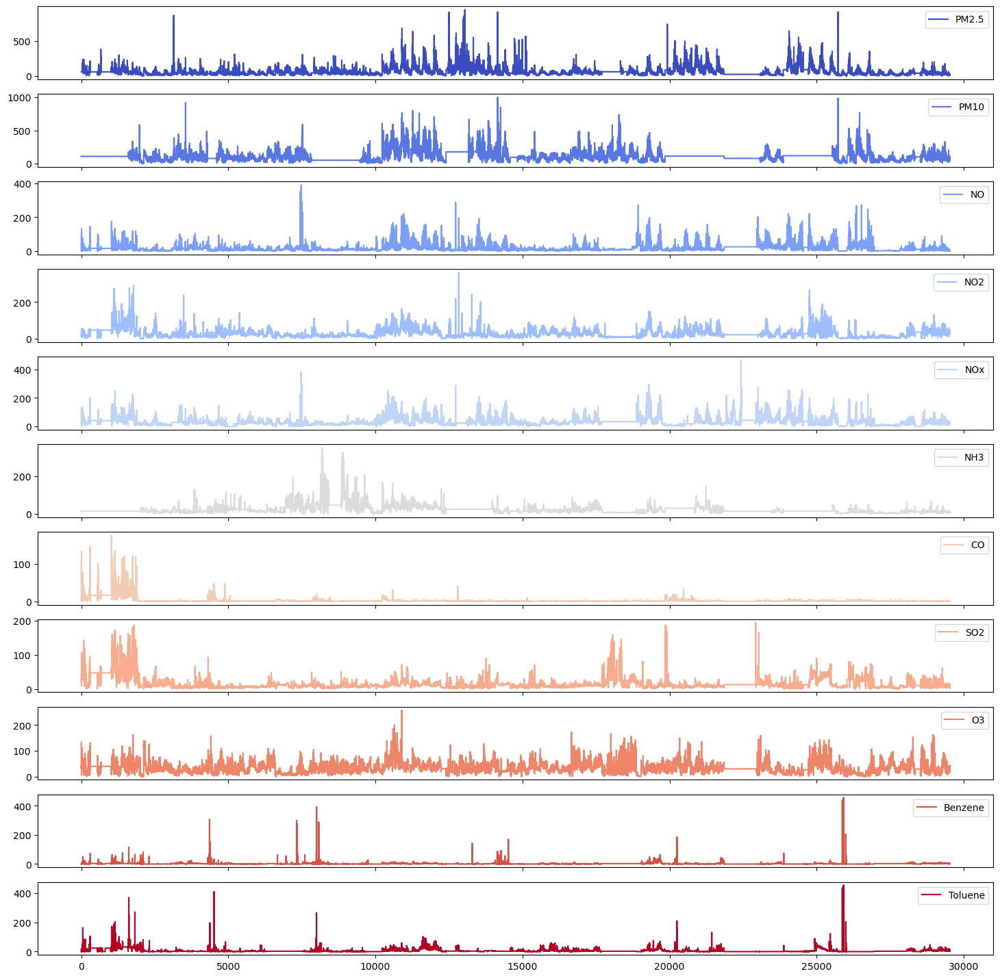

In [42]:
print('Distribution of different pollutants in 2015-202')
df_city_day.plot(kind='line',figsize=(18,18),cmap='coolwarm',subplots=True,fontsize=10);

### inference:
1. Benzene and Toluene have been pretty much normal with some perticular hikes
2. Maximumhikes are orberved in pm2.5 and pm10 levels

In [43]:
cat_cols = df.dtypes[df.dtypes=='object'].index
num_cols = df.dtypes[df.dtypes!='object'].index
print(cat_cols)
print(num_cols)

Index(['City', 'AQI_Bucket'], dtype='object')
Index(['Date', 'PM2.5', 'PM10', 'NO', 'NO2', 'NOx', 'NH3', 'CO', 'SO2', 'O3',
       'Benzene', 'Toluene', 'AQI'],
      dtype='object')


### Countplot- showing number of records in each city

<Axes: xlabel='City', ylabel='count'>

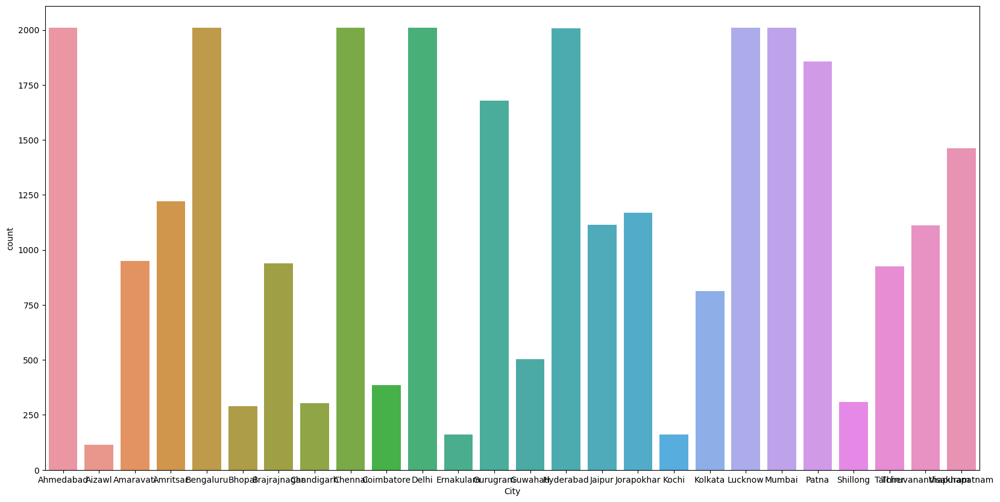

In [44]:
plt.figure(figsize=(20,10))
sns.countplot(x=df['City'])

### inference:
1. There are least records from Aizwal,Ernakulam, kochi and shillong
2. highest number of records are in Ahmedabad,Amritsar,Chennai,Delhi,Hyderabad,Lucknow and Mumbai with 2009 records.

### Plotting bubble chart

In [45]:
import plotly.express as px
scatter=px.scatter(df,x='City',y='AQI')
scatter.show()

#### Inference:
Ahmedabad shows higher influence pm2.5 with respect to AQI

## Scatter plot between PM2.5 and each City

In [46]:
scatter2=px.scatter(df,x="PM2.5",y='AQI')
scatter2.show()

#### Inference:
AQI and PM2.5 are non linearly distributed

In [47]:
cont_cols=['PM2.5', 'PM10', 'NO', 'NO2', 'NOx', 'NH3', 'CO', 'SO2', 'O3',
       'Benzene', 'Toluene', 'AQI']

## kdeplot based on continuous columns except date

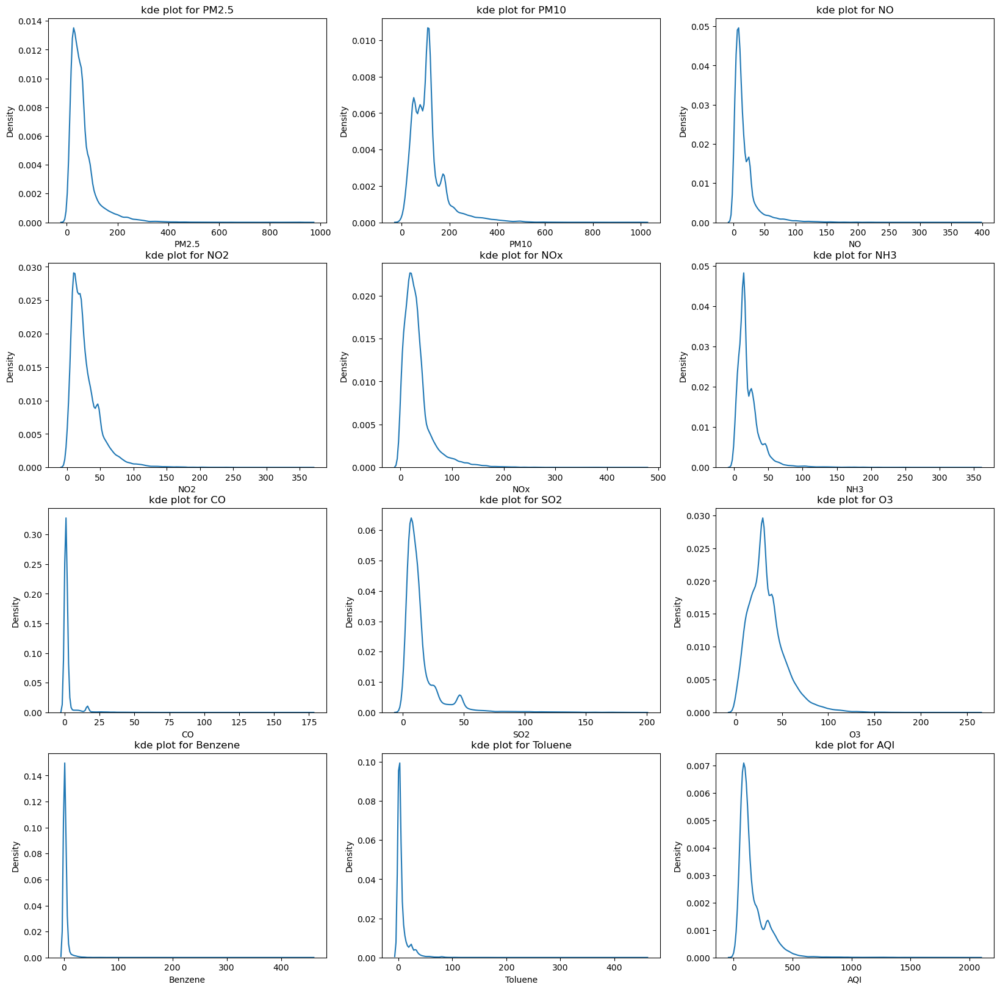

In [48]:
plt.figure(figsize=(20,20))
for i in range(0,len(cont_cols)):
    plt.subplot(4,3,i+1)
    sns.kdeplot(x=df[cont_cols[i]])
    plt.title(f'kde plot for {cont_cols[i]}')
    
plt.show()

### Pairplot to see covariance between each continuous column

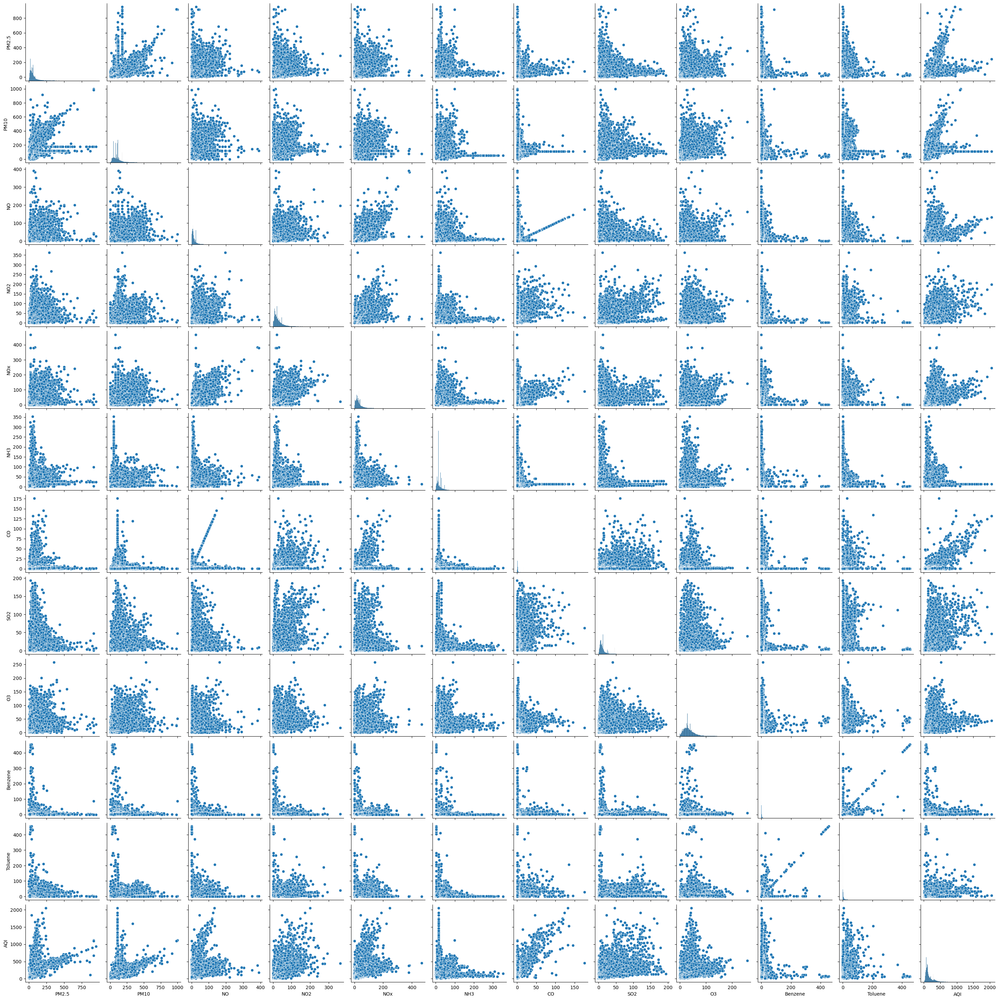

In [49]:
sns.pairplot(data=df[cont_cols]) 
plt.show()

### Boxplot to see the outliers in each coloumn based on city

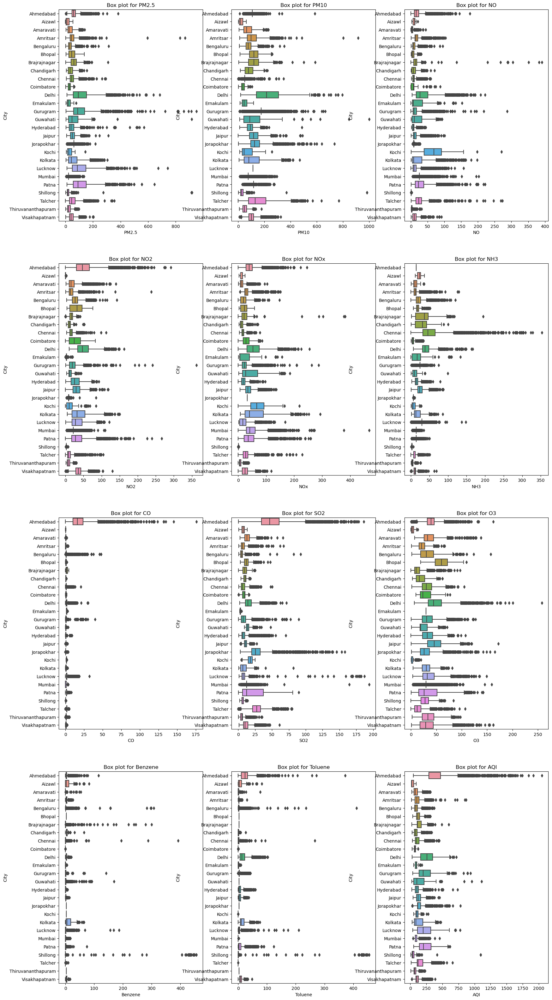

In [50]:
plt.figure(figsize=(20,40))
for i in range(0,len(cont_cols)):
    plt.subplot(4,3,i+1)
    sns.boxplot(x=df[cont_cols[i]],y=df['City'])
    plt.title(f'Box plot for {cont_cols[i]}')
    
plt.show()


In [51]:
# the boxcox indicates extreme outliers with respect to each pollutant in each city showing irregular trends

#### Correlation
<pre>
corr(a,b) = coor(b,a)
corr(a,a) = corr(b,b) = 1
corr ranges between -1 to 1

i) Corr amongst the independent features
ii) Corr of independent feature wrt target variable
</pre>

### Correlation - Heat map

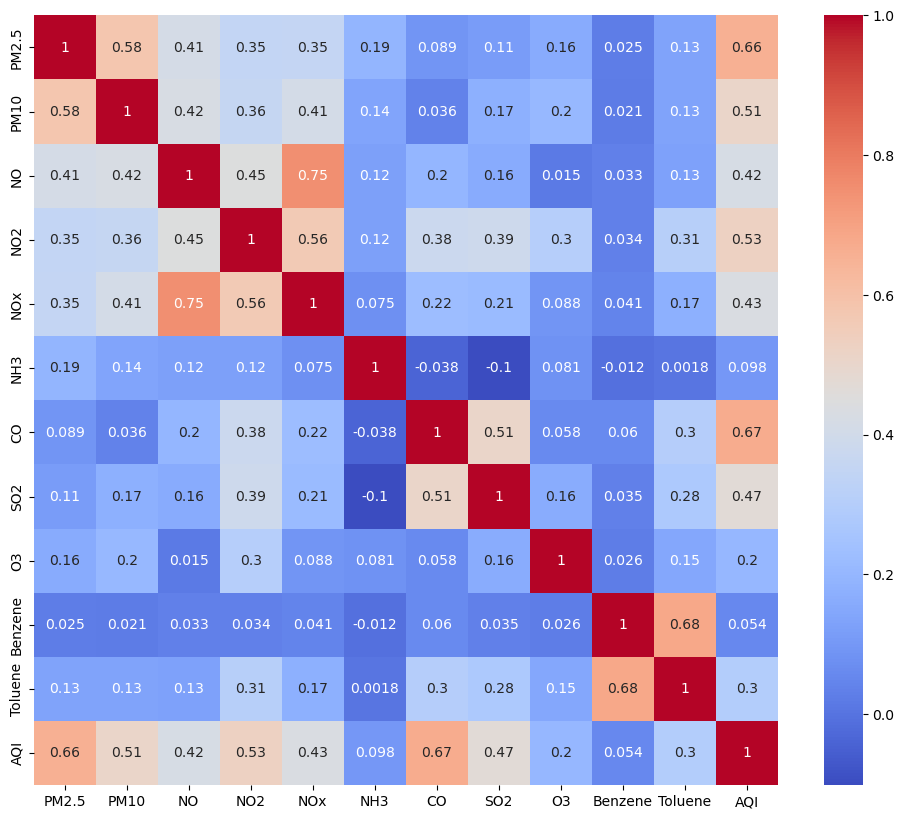

In [52]:
plt.figure(figsize=(12,10))
sns.heatmap(df.corr(),cmap='coolwarm',annot=True);

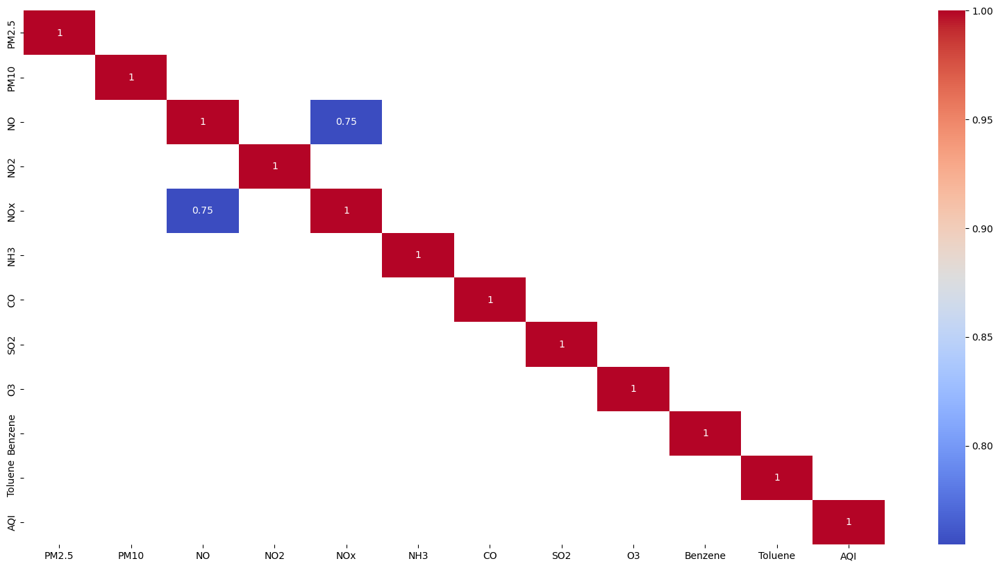

In [53]:
corr=df.corr()
plt.figure(figsize=(20,10))
sns.heatmap(corr[abs(corr)>=0.7],annot=True,cmap='coolwarm')
plt.show()

### Variance Inflation Factor

In [54]:
from statsmodels.stats.outliers_influence import variance_inflation_factor

In [55]:
x = df.iloc[:,2:-2]
print(x.shape)
y = df.iloc[:,-2:]
print(y.shape)
y.head()

(29531, 11)
(29531, 2)


,AQI,AQI_Bucket
0,149.0,Moderate
1,105.0,Moderate
2,300.0,Poor
3,105.0,Moderate
4,329.0,Very Poor


In [56]:
vif = pd.DataFrame()
vif['Features'] = x.columns
vif.head()
vif['VIF'] = [variance_inflation_factor(x.values,i) for i in range(x.shape[1])]
# # i=0,1,2
vif = vif.sort_values(by='VIF',ascending=False)
vif

,Features,VIF
4,NOx,5.892472
1,PM10,5.198749
3,NO2,4.918236
2,NO,4.240851
0,PM2.5,3.520734
8,O3,3.356988
10,Toluene,2.820558
7,SO2,2.549182
9,Benzene,2.149107
5,NH3,1.968149


In [57]:
# it is highly correlated with NO and its vif is greater than 4
df.drop(['NOx'],axis=1,inplace=True)
df.shape

(29531, 14)

## Machine Learning Models
<pre>
1) For classification on df_class dataset with target variable as AQI_Bucket:
     -- Naive Bayes
     -- Decision Tree Classifier 
     -- XGBoost
2) For regression on df_reg dataset with target variable as AQI
     -- Linear Regression with OLS
     -- Descision Tree Regression
     -- Random Forest Regression
</pre>

### Checking Normality of Dependent Featrue

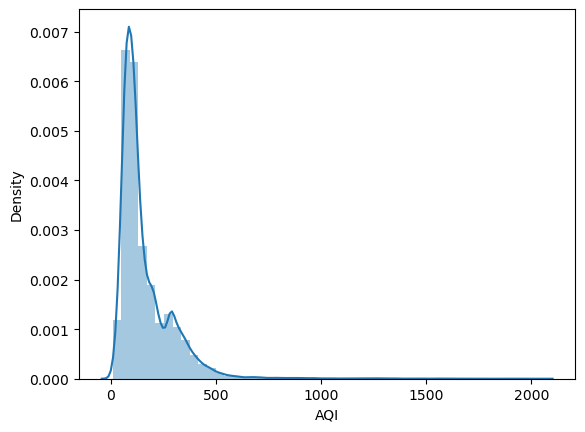

In [58]:
sns.distplot(df['AQI'])
plt.show()

In [59]:
# AQI is heavily left skewed therefore we are checking its goodness of fit
from scipy.stats import jarque_bera

In [60]:
# Ho : Data is normally dist =>  p>0.05 => Ho is True
# H1 : Data is not normally dist => p<=0.05 
ts1,p1 = jarque_bera(df['AQI'])
print(ts1,p1)

671103.2523077488 0.0


In [61]:
# p1 < 0.05 therefore H0 is false

In [62]:
ts1,p2 = jarque_bera(np.log(df['AQI']))
print(ts1,p2)

572.7995745467422 4.151000339608766e-125


In [63]:
# as log is giving values closer to 0.05 there fore we are taking log of target variable now

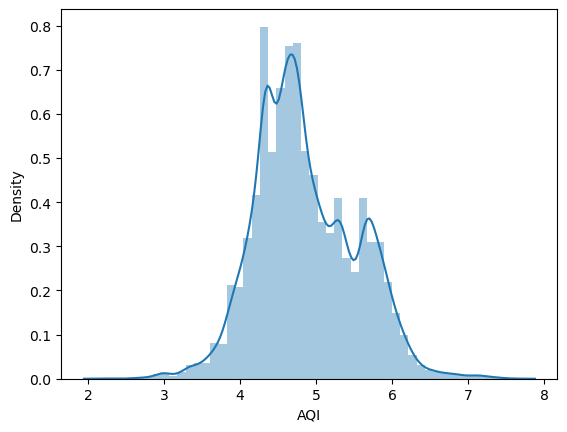

In [64]:
sns.distplot(np.log(df['AQI']))
plt.show()

### Outlier Identification

In [65]:
cont_cols

['PM2.5',
 'PM10',
 'NO',
 'NO2',
 'NOx',
 'NH3',
 'CO',
 'SO2',
 'O3',
 'Benzene',
 'Toluene',
 'AQI']

In [66]:
num_cols

Index(['Date', 'PM2.5', 'PM10', 'NO', 'NO2', 'NOx', 'NH3', 'CO', 'SO2', 'O3',
       'Benzene', 'Toluene', 'AQI'],
      dtype='object')

In [67]:
num_cols1=['PM2.5','PM10','NO','NO2','NH3','CO','SO2','O3','Benzene','Toluene','AQI']

In [68]:
df[num_cols1].describe(percentiles=[0.01,0.02,0.05,0.95,0.97,0.98,0.99]).T

,count,mean,std,min,1%,2%,5%,50%,95%,97%,98%,99%,max
PM2.5,29531.0,64.495018,60.418818,0.04,8.293,10.296,14.130,48.17,180.215,218.644,248.102,298.980,949.99
PM10,29531.0,112.321444,74.973201,0.01,16.866,22.492,30.955,107.67,255.335,308.659,346.534,405.394,1000.00
NO,29531.0,17.586426,21.513692,0.02,0.790,0.940,1.830,10.58,57.305,73.722,86.350,110.128,390.68
NO2,29531.0,28.038496,23.404976,0.01,1.663,2.660,5.110,21.46,70.830,83.090,94.438,114.051,362.21
NH3,29531.0,21.785599,21.530224,0.01,1.520,2.090,3.610,14.50,53.640,65.047,78.232,106.561,352.89
CO,29531.0,2.469716,7.014473,0.00,0.000,0.000,0.000,0.90,14.185,16.245,21.032,33.265,175.81
SO2,29531.0,15.120249,17.676906,0.01,1.380,1.870,2.800,9.90,46.780,54.475,68.438,98.560,193.86
O3,29531.0,33.794051,20.445550,0.01,1.703,4.110,7.655,29.62,71.780,81.242,89.244,102.441,257.73
Benzene,29531.0,3.069090,14.245363,0.00,0.000,0.000,0.000,1.25,8.230,12.580,17.300,25.837,455.03
Toluene,29531.0,7.250242,17.424784,0.00,0.000,0.000,0.000,2.65,31.460,36.721,44.000,61.435,454.85


In [69]:
def ol_treatment_low_end(x):
    x = x.clip(lower = x.quantile(0.01))
    return x

def ol_treatment_upper_end(x):
    x = x.clip(upper = x.quantile(0.99))
    return x

In [70]:
lower_end = ['PM2.5','PM10','NO','NO2','NH3','CO','SO2','O3','AQI']

upper_end = ['PM2.5','PM10','NO','NO2','NH3','CO','SO2','O3','Benzene','Toluene','AQI']

In [71]:
df[lower_end] = df[lower_end].apply(ol_treatment_low_end)
df[upper_end] = df[upper_end].apply(ol_treatment_upper_end)

In [72]:
df[num_cols1].describe(percentiles=[0.01,0.05,0.97,0.98,0.99]).T

,count,mean,std,min,1%,5%,50%,97%,98%,99%,max
PM2.5,29531.0,63.470772,53.746686,8.293,8.2951,14.130,48.17,218.644,248.102,298.7910,298.980
PM10,29531.0,111.525615,70.228249,16.866,16.8702,30.955,107.67,308.659,346.534,405.2218,405.394
NO,29531.0,17.225570,19.099520,0.790,0.7900,1.830,10.58,73.722,86.350,110.1196,110.128
NO2,29531.0,27.699433,21.494318,1.663,1.6651,5.110,21.46,83.090,94.438,114.0447,114.051
NH3,29531.0,21.236761,17.604857,1.520,1.5200,3.610,14.50,65.047,78.232,106.5547,106.561
CO,29531.0,2.252263,5.047125,0.000,0.0000,0.000,0.90,16.245,21.032,33.2335,33.265
SO2,29531.0,14.839385,15.861782,1.380,1.3800,2.800,9.90,54.475,68.438,98.5180,98.560
O3,29531.0,33.608605,19.586861,1.703,1.7051,7.655,29.62,81.242,89.244,102.3717,102.441
Benzene,29531.0,2.466928,3.923223,0.000,0.0000,0.000,1.25,12.580,17.300,25.8349,25.837
Toluene,29531.0,6.697571,10.941144,0.000,0.0000,0.000,2.65,36.721,44.000,61.4035,61.435


In [73]:
df_reg=df.drop('AQI_Bucket',axis=1)
df_class=df.drop('AQI',axis=1)
df_TS=df.copy()

In [74]:
df_class.columns

Index(['Date', 'City', 'PM2.5', 'PM10', 'NO', 'NO2', 'NH3', 'CO', 'SO2', 'O3',
       'Benzene', 'Toluene', 'AQI_Bucket'],
      dtype='object')

In [75]:
df_reg.columns

Index(['Date', 'City', 'PM2.5', 'PM10', 'NO', 'NO2', 'NH3', 'CO', 'SO2', 'O3',
       'Benzene', 'Toluene', 'AQI'],
      dtype='object')

### Encoding Categorical Columns


In [76]:
cat_cols

Index(['City', 'AQI_Bucket'], dtype='object')

In [77]:
df['City'].value_counts()

Ahmedabad             2009
Delhi                 2009
Mumbai                2009
Bengaluru             2009
Lucknow               2009
Chennai               2009
Hyderabad             2006
Patna                 1858
Gurugram              1679
Visakhapatnam         1462
Amritsar              1221
Jorapokhar            1169
Jaipur                1114
Thiruvananthapuram    1112
Amaravati              951
Brajrajnagar           938
Talcher                925
Kolkata                814
Guwahati               502
Coimbatore             386
Shillong               310
Chandigarh             304
Bhopal                 289
Ernakulam              162
Kochi                  162
Aizawl                 113
Name: City, dtype: int64

In [78]:
df1_dummy = pd.get_dummies(df,columns=['City'])
df1_dummy.head()

,Date,PM2.5,PM10,NO,NO2,NH3,CO,SO2,O3,Benzene,...,City_Jorapokhar,City_Kochi,City_Kolkata,City_Lucknow,City_Mumbai,City_Patna,City_Shillong,City_Talcher,City_Thiruvananthapuram,City_Visakhapatnam
0,2015-01-01,58.37,107.96,0.92,18.22,14.5,0.92,27.64,102.441,0.00,...,0,0,0,0,0,0,0,0,0,0
1,2015-01-02,58.37,107.96,0.97,15.69,14.5,0.97,24.55,34.060,3.68,...,0,0,0,0,0,0,0,0,0,0
2,2015-01-03,58.37,107.96,17.40,19.30,14.5,17.40,29.07,30.700,6.80,...,0,0,0,0,0,0,0,0,0,0
3,2015-01-04,58.37,107.96,1.70,18.48,14.5,1.70,18.59,36.080,4.43,...,0,0,0,0,0,0,0,0,0,0
4,2015-01-05,58.37,107.96,22.10,21.42,14.5,22.10,39.33,39.310,7.01,...,0,0,0,0,0,0,0,0,0,0


In [79]:
df_class=df1_dummy.drop('AQI',axis=1)
df_class.head(1)

,Date,PM2.5,PM10,NO,NO2,NH3,CO,SO2,O3,Benzene,...,City_Jorapokhar,City_Kochi,City_Kolkata,City_Lucknow,City_Mumbai,City_Patna,City_Shillong,City_Talcher,City_Thiruvananthapuram,City_Visakhapatnam
0,2015-01-01,58.37,107.96,0.92,18.22,14.5,0.92,27.64,102.441,0.0,...,0,0,0,0,0,0,0,0,0,0


In [80]:
from sklearn.preprocessing import OrdinalEncoder

In [81]:
# Oridnal Categorial column
df_class['AQI_Bucket'].value_counts()

Moderate        10166
Satisfactory    10136
Poor             3846
Very Poor        2418
Good             1576
Severe           1389
Name: AQI_Bucket, dtype: int64

In [82]:
ord_enc = OrdinalEncoder(categories=[['Good','Satisfactory','Moderate','Poor',
                                     'Very Poor','Severe']])
res_ord = ord_enc.fit_transform(df_class[['AQI_Bucket']])
print(type(res_ord))
res_ord

<class 'numpy.ndarray'>


array([[2.],
       [2.],
       [3.],
       ...,
       [1.],
       [1.],
       [0.]])

In [83]:
df_class['AQI_Bucket_Enc'] = res_ord
df_class.head()

,Date,PM2.5,PM10,NO,NO2,NH3,CO,SO2,O3,Benzene,...,City_Kochi,City_Kolkata,City_Lucknow,City_Mumbai,City_Patna,City_Shillong,City_Talcher,City_Thiruvananthapuram,City_Visakhapatnam,AQI_Bucket_Enc
0,2015-01-01,58.37,107.96,0.92,18.22,14.5,0.92,27.64,102.441,0.00,...,0,0,0,0,0,0,0,0,0,2.0
1,2015-01-02,58.37,107.96,0.97,15.69,14.5,0.97,24.55,34.060,3.68,...,0,0,0,0,0,0,0,0,0,2.0
2,2015-01-03,58.37,107.96,17.40,19.30,14.5,17.40,29.07,30.700,6.80,...,0,0,0,0,0,0,0,0,0,3.0
3,2015-01-04,58.37,107.96,1.70,18.48,14.5,1.70,18.59,36.080,4.43,...,0,0,0,0,0,0,0,0,0,2.0
4,2015-01-05,58.37,107.96,22.10,21.42,14.5,22.10,39.33,39.310,7.01,...,0,0,0,0,0,0,0,0,0,4.0


In [84]:
df_class=df_class.drop('AQI_Bucket',axis=1)
df_class.head()

,Date,PM2.5,PM10,NO,NO2,NH3,CO,SO2,O3,Benzene,...,City_Kochi,City_Kolkata,City_Lucknow,City_Mumbai,City_Patna,City_Shillong,City_Talcher,City_Thiruvananthapuram,City_Visakhapatnam,AQI_Bucket_Enc
0,2015-01-01,58.37,107.96,0.92,18.22,14.5,0.92,27.64,102.441,0.00,...,0,0,0,0,0,0,0,0,0,2.0
1,2015-01-02,58.37,107.96,0.97,15.69,14.5,0.97,24.55,34.060,3.68,...,0,0,0,0,0,0,0,0,0,2.0
2,2015-01-03,58.37,107.96,17.40,19.30,14.5,17.40,29.07,30.700,6.80,...,0,0,0,0,0,0,0,0,0,3.0
3,2015-01-04,58.37,107.96,1.70,18.48,14.5,1.70,18.59,36.080,4.43,...,0,0,0,0,0,0,0,0,0,2.0
4,2015-01-05,58.37,107.96,22.10,21.42,14.5,22.10,39.33,39.310,7.01,...,0,0,0,0,0,0,0,0,0,4.0


### Select x(independent feature) and y(depenndet feature)

In [85]:
df_class.set_index('Date',inplace=True)
df_class.head()

,PM2.5,PM10,NO,NO2,NH3,CO,SO2,O3,Benzene,Toluene,...,City_Kochi,City_Kolkata,City_Lucknow,City_Mumbai,City_Patna,City_Shillong,City_Talcher,City_Thiruvananthapuram,City_Visakhapatnam,AQI_Bucket_Enc
Date,,,,,,,,,,,,,,,,,,,,,
2015-01-01,58.37,107.96,0.92,18.22,14.5,0.92,27.64,102.441,0.00,0.02,...,0,0,0,0,0,0,0,0,0,2.0
2015-01-02,58.37,107.96,0.97,15.69,14.5,0.97,24.55,34.060,3.68,5.50,...,0,0,0,0,0,0,0,0,0,2.0
2015-01-03,58.37,107.96,17.40,19.30,14.5,17.40,29.07,30.700,6.80,16.40,...,0,0,0,0,0,0,0,0,0,3.0
2015-01-04,58.37,107.96,1.70,18.48,14.5,1.70,18.59,36.080,4.43,10.14,...,0,0,0,0,0,0,0,0,0,2.0
2015-01-05,58.37,107.96,22.10,21.42,14.5,22.10,39.33,39.310,7.01,18.89,...,0,0,0,0,0,0,0,0,0,4.0


In [86]:
df_class

,PM2.5,PM10,NO,NO2,NH3,CO,SO2,O3,Benzene,Toluene,...,City_Kochi,City_Kolkata,City_Lucknow,City_Mumbai,City_Patna,City_Shillong,City_Talcher,City_Thiruvananthapuram,City_Visakhapatnam,AQI_Bucket_Enc
Date,,,,,,,,,,,,,,,,,,,,,
2015-01-01,58.37,107.96,0.92,18.22,14.50,0.92,27.64,102.441,0.00,0.02,...,0,0,0,0,0,0,0,0,0,2.0
2015-01-02,58.37,107.96,0.97,15.69,14.50,0.97,24.55,34.060,3.68,5.50,...,0,0,0,0,0,0,0,0,0,2.0
2015-01-03,58.37,107.96,17.40,19.30,14.50,17.40,29.07,30.700,6.80,16.40,...,0,0,0,0,0,0,0,0,0,3.0
2015-01-04,58.37,107.96,1.70,18.48,14.50,1.70,18.59,36.080,4.43,10.14,...,0,0,0,0,0,0,0,0,0,2.0
2015-01-05,58.37,107.96,22.10,21.42,14.50,22.10,39.33,39.310,7.01,18.89,...,0,0,0,0,0,0,0,0,0,4.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2020-06-27,15.02,50.94,7.68,25.06,12.47,0.47,8.55,23.300,2.24,12.07,...,0,0,0,0,0,0,0,0,1,0.0
2020-06-28,24.38,74.09,3.42,26.06,11.99,0.52,12.72,30.140,0.74,2.21,...,0,0,0,0,0,0,0,0,1,1.0
2020-06-29,22.91,65.73,3.45,29.53,10.71,0.48,8.42,30.960,0.01,0.01,...,0,0,0,0,0,0,0,0,1,1.0


In [87]:
x = df_class.drop('AQI_Bucket_Enc',axis=1)
y = df_class['AQI_Bucket_Enc']
print(type(x))
print(type(y))
print(x.shape)
print(y.shape)

<class 'pandas.core.frame.DataFrame'>
<class 'pandas.core.series.Series'>
(29531, 36)
(29531,)


In [88]:
# Split data into train and test
from sklearn.model_selection import train_test_split

In [89]:
x_train,x_test,y_train,y_test = train_test_split(x,y,test_size=0.30,
                                                random_state=42)
print(x_train.shape)
print(x_test.shape)
print(y_train.shape)
print(y_test.shape)

(20671, 36)
(8860, 36)
(20671,)
(8860,)


In [90]:
from sklearn.metrics import confusion_matrix,classification_report,accuracy_score
from sklearn.metrics import precision_score,recall_score


In [91]:
def eval_model_classification(ytest,ypred):
    cm=confusion_matrix(ytest,ypred)
    cr=classification_report(ytest,ypred)
    pre1=precision_score(ytest,ypred,average='micro')
    rec1=recall_score(ytest,ypred,average='micro')
    print('Confusion Matrix',cm)
    print('Classification report',cr)
    print("precision",pre1)
    print("recall",rec1)
    
def gen_res_classification(model,xtrain,xtest,ytrain,ytest,ypred,model_name):
    eval_model_classification(ytest,ypred)
    train_acc=model.score(xtrain,ytrain)
    test_acc=model.score(xtest,ytest)
    #model_accuracy=model.accuracy_score(ytest,ypred)
    res= pd.DataFrame({'Train Acc':train_acc,'Test acc':test_acc},index=[model_name])
    return res

In [92]:
y_train

Date
2016-05-22    1.0
2020-05-21    2.0
2015-08-21    1.0
2015-03-27    1.0
2016-02-22    2.0
             ... 
2019-09-26    1.0
2018-01-01    1.0
2017-05-10    3.0
2018-05-02    2.0
2019-12-05    2.0
Name: AQI_Bucket_Enc, Length: 20671, dtype: float64

# Decision Tree Classiifier

In [93]:

from sklearn.model_selection import GridSearchCV, RandomizedSearchCV
hparams = {'criterion':['gini','entropy'],
          'max_depth':[4,5,6,7,8],
          'min_samples_split':[8,10,12,15,20]}

In [94]:
# with GridSearchCV
dt_model = DecisionTreeClassifier(random_state=0)

gs1 = GridSearchCV(dt_model,param_grid=hparams,scoring='accuracy',cv=5)
gs1.fit(x_train,y_train)

GridSearchCV(cv=5, estimator=DecisionTreeClassifier(random_state=0),
             param_grid={'criterion': ['gini', 'entropy'],
                         'max_depth': [4, 5, 6, 7, 8],
                         'min_samples_split': [8, 10, 12, 15, 20]},
             scoring='accuracy')

In [95]:
print(gs1.best_params_)
print(gs1.best_estimator_)
print(gs1.best_score_)

{'criterion': 'gini', 'max_depth': 8, 'min_samples_split': 8}
DecisionTreeClassifier(max_depth=8, min_samples_split=8, random_state=0)
0.7880121024283833


In [96]:
dt_gs = DecisionTreeClassifier(**gs1.best_params_)
dt_gs.fit(x_train,y_train)

DecisionTreeClassifier(max_depth=8, min_samples_split=8)

In [97]:
ypred_dt1 = dt_gs.predict(x_test)
dt1_res = gen_res_classification(dt_gs,x_train,x_test,y_train,y_test,ypred_dt1,'DT1_GS1(ent/gini,md='',mss='')')
dt1_res

Confusion Matrix [[ 249  194    7    1    0    0]
 [  69 2596  334    4    1    0]
 [   1  503 2458  146    5    2]
 [   0   12  216  831   89    2]
 [   0    4   14  125  507   71]
 [   0    0    6   14   80  319]]
Classification report               precision    recall  f1-score   support

         0.0       0.78      0.55      0.65       451
         1.0       0.78      0.86      0.82      3004
         2.0       0.81      0.79      0.80      3115
         3.0       0.74      0.72      0.73      1150
         4.0       0.74      0.70      0.72       721
         5.0       0.81      0.76      0.78       419

    accuracy                           0.79      8860
   macro avg       0.78      0.73      0.75      8860
weighted avg       0.79      0.79      0.78      8860

precision 0.7855530474040632
recall 0.7855530474040632


,Train Acc,Test acc
"DT1_GS1(ent/gini,md=,mss=)",0.823618,0.785553


In [98]:
dt_rs=DecisionTreeClassifier(random_state=0)
rs1=RandomizedSearchCV(dt_rs,param_distributions=hparams,scoring='accuracy',cv=5,n_iter=20)
rs1.fit(x_train,y_train)

RandomizedSearchCV(cv=5, estimator=DecisionTreeClassifier(random_state=0),
                   n_iter=20,
                   param_distributions={'criterion': ['gini', 'entropy'],
                                        'max_depth': [4, 5, 6, 7, 8],
                                        'min_samples_split': [8, 10, 12, 15,
                                                              20]},
                   scoring='accuracy')

In [99]:
print(rs1.best_params_)
print(rs1.best_estimator_)
print(rs1.best_score_)

{'min_samples_split': 8, 'max_depth': 8, 'criterion': 'gini'}
DecisionTreeClassifier(max_depth=8, min_samples_split=8, random_state=0)
0.7880121024283833


In [100]:
dt_rs = DecisionTreeClassifier(**rs1.best_params_)
dt_rs.fit(x_train,y_train)

DecisionTreeClassifier(max_depth=8, min_samples_split=8)

In [101]:
ypred_dt2 = dt_rs.predict(x_test)
dt2_res = gen_res_classification(dt_rs,x_train,x_test,y_train,y_test,ypred_dt2,'DT1_RS1(ent/gini,md='',mss='')')
dt2_res

Confusion Matrix [[ 250  193    7    1    0    0]
 [  69 2596  334    4    1    0]
 [   1  503 2458  146    5    2]
 [   0   12  216  830   90    2]
 [   0    4   14  123  510   70]
 [   0    0    6   14   82  317]]
Classification report               precision    recall  f1-score   support

         0.0       0.78      0.55      0.65       451
         1.0       0.78      0.86      0.82      3004
         2.0       0.81      0.79      0.80      3115
         3.0       0.74      0.72      0.73      1150
         4.0       0.74      0.71      0.72       721
         5.0       0.81      0.76      0.78       419

    accuracy                           0.79      8860
   macro avg       0.78      0.73      0.75      8860
weighted avg       0.79      0.79      0.78      8860

precision 0.785665914221219
recall 0.785665914221219


,Train Acc,Test acc
"DT1_RS1(ent/gini,md=,mss=)",0.823618,0.785666


# NaiveBayes

In [102]:

from sklearn.naive_bayes import GaussianNB

In [103]:
gnb=GaussianNB()
gnb.fit(x_train,y_train)
ypred_gnb=gnb.predict(x_test)
gnb_res=gen_res_classification(gnb,x_train,x_test,y_train,y_test,ypred_gnb,'Gaussian Naive Bayes')
gnb_res

Confusion Matrix [[ 409   14    2    4    1   21]
 [1354  770  376   38   93  373]
 [ 259  223  934  288  209 1202]
 [   4   10   77   90   93  876]
 [   1    0   11   25   56  628]
 [   0    0    0    4   11  404]]
Classification report               precision    recall  f1-score   support

         0.0       0.20      0.91      0.33       451
         1.0       0.76      0.26      0.38      3004
         2.0       0.67      0.30      0.41      3115
         3.0       0.20      0.08      0.11      1150
         4.0       0.12      0.08      0.09       721
         5.0       0.12      0.96      0.21       419

    accuracy                           0.30      8860
   macro avg       0.34      0.43      0.26      8860
weighted avg       0.54      0.30      0.32      8860

precision 0.30056433408577876
recall 0.30056433408577876


,Train Acc,Test acc
Gaussian Naive Bayes,0.309129,0.300564


# ADABoost Classifier

In [104]:

from sklearn.ensemble import AdaBoostClassifier

In [105]:
abc=AdaBoostClassifier(n_estimators=50,learning_rate=1,random_state=25)
abc_model=abc.fit(x_train,y_train)
ypred_abc=abc_model.predict(x_test)
abc_res=gen_res_classification(abc_model,x_train,x_test,y_train,y_test,ypred_abc,'AdaBoostClassifier')
abc_res

Confusion Matrix [[ 293  147    9    2    0    0]
 [ 276 2449  272    5    2    0]
 [  34  603 2292  127   31   28]
 [   0   14  370  432  292   42]
 [   1    2   30  188  378  122]
 [   0    0    8   15  152  244]]
Classification report               precision    recall  f1-score   support

         0.0       0.49      0.65      0.56       451
         1.0       0.76      0.82      0.79      3004
         2.0       0.77      0.74      0.75      3115
         3.0       0.56      0.38      0.45      1150
         4.0       0.44      0.52      0.48       721
         5.0       0.56      0.58      0.57       419

    accuracy                           0.69      8860
   macro avg       0.60      0.61      0.60      8860
weighted avg       0.69      0.69      0.68      8860

precision 0.6871331828442437
recall 0.6871331828442437


,Train Acc,Test acc
AdaBoostClassifier,0.684195,0.687133


In [106]:
# Support Vector Classifier
from sklearn.svm import SVC

In [107]:

# svc=SVC(probability=True,kernel='linear')
# svc_model=svc.fit(x_train,y_train)
# ypred_svc=svc_model.predict(x_test)
# svc_res=gen_res_classification(svc_model,x_train,x_test,y_train,y_test,ypred_svc,'Support Vector Classifier')
# svc_res

In [108]:
# # Adaboost with SVC
# abc1=AdaBoostClassifier(n_estimators=50,base-estimator=svc,learning_rate=1,random_state=0)
# abc1_model=abc1.fit(x_train,y_train)
# ypred_abc1=abc1_model.predict(x_test)
# abc1_res=gen_res_classification(abc1_model,x_train,x_test,y_train,y_test,ypred_abc1,'AdaBoost- SVC')
# abc1_res

# XGBoost Classifier

In [109]:
from xgboost import XGBClassifier

In [110]:
from sklearn.preprocessing import StandardScaler

# xgboost model without scaling

In [111]:
xgb_model=XGBClassifier(reg_alpha=1,gamma=0)
xgb_model1=xgb_model.fit(x_train,y_train)
ypred_xgb= xgb_model1.predict(x_test)
xgb_res=gen_res_classification(xgb_model1,x_train,x_test,y_train,y_test,ypred_xgb,"XGBoost Classifier")
xgb_res

Confusion Matrix [[ 331  114    5    1    0    0]
 [  76 2631  291    6    0    0]
 [   0  361 2601  145    6    2]
 [   0    7  199  844   95    5]
 [   0    3   12  104  551   51]
 [   0    0    2    9   70  338]]
Classification report               precision    recall  f1-score   support

         0.0       0.81      0.73      0.77       451
         1.0       0.84      0.88      0.86      3004
         2.0       0.84      0.83      0.84      3115
         3.0       0.76      0.73      0.75      1150
         4.0       0.76      0.76      0.76       721
         5.0       0.85      0.81      0.83       419

    accuracy                           0.82      8860
   macro avg       0.81      0.79      0.80      8860
weighted avg       0.82      0.82      0.82      8860

precision 0.8234762979683973
recall 0.8234762979683973


,Train Acc,Test acc
XGBoost Classifier,0.955445,0.823476


# Gradient descent with scaling

In [112]:
ss = StandardScaler()
ss.fit(x_train)
x_train_ss = ss.transform(x_train)
# x_train_ss  = ss.fit_transform(x_train)

x_test_ss = ss.transform(x_test)
print(x_train_ss.shape)
print(x_test_ss.shape)

(20671, 36)
(8860, 36)


In [113]:
x_train_ss = pd.DataFrame(x_train_ss, columns=x_train.columns)
x_test_ss = pd.DataFrame(x_test_ss, columns=x_test.columns)
print(x_train_ss.shape)
print(x_test_ss.shape)

(20671, 36)
(8860, 36)


In [114]:
xgb_ss=xgb_model.fit(x_train_ss,y_train)
ypred_xgbss=xgb_ss.predict(x_test_ss)
xgbss_res=gen_res_classification(xgb_ss,x_train_ss,x_test_ss,y_train,y_test,ypred_xgbss,'XG Boost-scaled')
xgbss_res

Confusion Matrix [[ 331  114    5    1    0    0]
 [  76 2631  291    6    0    0]
 [   0  361 2601  145    6    2]
 [   0    7  199  844   95    5]
 [   0    3   12  104  551   51]
 [   0    0    2    9   70  338]]
Classification report               precision    recall  f1-score   support

         0.0       0.81      0.73      0.77       451
         1.0       0.84      0.88      0.86      3004
         2.0       0.84      0.83      0.84      3115
         3.0       0.76      0.73      0.75      1150
         4.0       0.76      0.76      0.76       721
         5.0       0.85      0.81      0.83       419

    accuracy                           0.82      8860
   macro avg       0.81      0.79      0.80      8860
weighted avg       0.82      0.82      0.82      8860

precision 0.8234762979683973
recall 0.8234762979683973


,Train Acc,Test acc
XG Boost-scaled,0.955445,0.823476


# Randomforest Classifier

In [115]:

from sklearn.ensemble import RandomForestClassifier

In [116]:
rf=RandomForestClassifier(random_state=42)
rf_model=rf.fit(x_train,y_train)
ypred_rf= rf_model.predict(x_test)
rf_res=gen_res_classification(rf_model,x_train,x_test,y_train,y_test,ypred_rf,"RandomForestClassifier")
rf_res

Confusion Matrix [[ 308  138    4    1    0    0]
 [  56 2624  319    5    0    0]
 [   0  337 2650  123    4    1]
 [   0    8  208  834   96    4]
 [   0    1   15  107  554   44]
 [   0    0    7    8   82  322]]
Classification report               precision    recall  f1-score   support

         0.0       0.85      0.68      0.76       451
         1.0       0.84      0.87      0.86      3004
         2.0       0.83      0.85      0.84      3115
         3.0       0.77      0.73      0.75      1150
         4.0       0.75      0.77      0.76       721
         5.0       0.87      0.77      0.82       419

    accuracy                           0.82      8860
   macro avg       0.82      0.78      0.80      8860
weighted avg       0.82      0.82      0.82      8860

precision 0.8230248306997743
recall 0.8230248306997743


,Train Acc,Test acc
RandomForestClassifier,0.994679,0.823025


In [117]:
hparams_rf = {'n_estimators':[100,150],'max_features':['auto','sqrt','log2'],'max_depth':[10],
              'min_samples_split':[10,15],'criterion':['gini','entropy']}

In [118]:
# # RandomForest with GridSearchCV
# rf1 = RandomForestClassifier(random_state=0)
# gs_rf = GridSearchCV(estimator=rf1,param_grid=hparams_rf,cv=5)
# gs_rf.fit(x_train,y_train)

In [119]:
# gs_rf.best_params_
# rf2 = RandomForestClassifier(random_state=0,**gs_rf.best_params_)
# rf_model2=rf2.fit(x_train,y_train)
# ypred_rf2= rf_model2.predict(x_test)
# rf2_res=gen_res_classification(rf_model2,x_train,x_test,y_train,y_test,ypred_rf,"RandomForestClassifier-GS")
# rf2_res

In [120]:
#RESULT COMPARISON OF ALL CLASSIFIERS
res = pd.concat([dt1_res,dt2_res,gnb_res,abc_res,xgb_res,xgbss_res,rf_res])
res

,Train Acc,Test acc
"DT1_GS1(ent/gini,md=,mss=)",0.823618,0.785553
"DT1_RS1(ent/gini,md=,mss=)",0.823618,0.785666
Gaussian Naive Bayes,0.309129,0.300564
AdaBoostClassifier,0.684195,0.687133
XGBoost Classifier,0.955445,0.823476
XG Boost-scaled,0.955445,0.823476
RandomForestClassifier,0.994679,0.823025


# Regression models

In [121]:
from sklearn.linear_model import LinearRegression, Ridge, Lasso
from sklearn.tree import DecisionTreeRegressor,plot_tree
from sklearn.ensemble import RandomForestRegressor, AdaBoostRegressor, GradientBoostingRegressor
from sklearn.neighbors import KNeighborsRegressor
from xgboost import XGBRegressor
import statsmodels.api as sm   # OLS

In [122]:
from sklearn import ensemble

In [123]:
from sklearn.metrics import *

In [124]:
df_reg.head()

,Date,City,PM2.5,PM10,NO,NO2,NH3,CO,SO2,O3,Benzene,Toluene,AQI
0,2015-01-01,Ahmedabad,58.37,107.96,0.92,18.22,14.5,0.92,27.64,102.441,0.00,0.02,149.0
1,2015-01-02,Ahmedabad,58.37,107.96,0.97,15.69,14.5,0.97,24.55,34.060,3.68,5.50,105.0
2,2015-01-03,Ahmedabad,58.37,107.96,17.40,19.30,14.5,17.40,29.07,30.700,6.80,16.40,300.0
3,2015-01-04,Ahmedabad,58.37,107.96,1.70,18.48,14.5,1.70,18.59,36.080,4.43,10.14,105.0
4,2015-01-05,Ahmedabad,58.37,107.96,22.10,21.42,14.5,22.10,39.33,39.310,7.01,18.89,329.0


In [125]:
#setting date column as index
df_reg=df1_dummy.drop('AQI_Bucket',axis=1)
df_reg.head(1)


,Date,PM2.5,PM10,NO,NO2,NH3,CO,SO2,O3,Benzene,...,City_Jorapokhar,City_Kochi,City_Kolkata,City_Lucknow,City_Mumbai,City_Patna,City_Shillong,City_Talcher,City_Thiruvananthapuram,City_Visakhapatnam
0,2015-01-01,58.37,107.96,0.92,18.22,14.5,0.92,27.64,102.441,0.0,...,0,0,0,0,0,0,0,0,0,0


In [126]:
df_reg.set_index('Date',inplace=True)
df_reg.head()

,PM2.5,PM10,NO,NO2,NH3,CO,SO2,O3,Benzene,Toluene,...,City_Jorapokhar,City_Kochi,City_Kolkata,City_Lucknow,City_Mumbai,City_Patna,City_Shillong,City_Talcher,City_Thiruvananthapuram,City_Visakhapatnam
Date,,,,,,,,,,,,,,,,,,,,,
2015-01-01,58.37,107.96,0.92,18.22,14.5,0.92,27.64,102.441,0.00,0.02,...,0,0,0,0,0,0,0,0,0,0
2015-01-02,58.37,107.96,0.97,15.69,14.5,0.97,24.55,34.060,3.68,5.50,...,0,0,0,0,0,0,0,0,0,0
2015-01-03,58.37,107.96,17.40,19.30,14.5,17.40,29.07,30.700,6.80,16.40,...,0,0,0,0,0,0,0,0,0,0
2015-01-04,58.37,107.96,1.70,18.48,14.5,1.70,18.59,36.080,4.43,10.14,...,0,0,0,0,0,0,0,0,0,0
2015-01-05,58.37,107.96,22.10,21.42,14.5,22.10,39.33,39.310,7.01,18.89,...,0,0,0,0,0,0,0,0,0,0


In [127]:
df_reg.columns

Index(['PM2.5', 'PM10', 'NO', 'NO2', 'NH3', 'CO', 'SO2', 'O3', 'Benzene',
       'Toluene', 'AQI', 'City_Ahmedabad', 'City_Aizawl', 'City_Amaravati',
       'City_Amritsar', 'City_Bengaluru', 'City_Bhopal', 'City_Brajrajnagar',
       'City_Chandigarh', 'City_Chennai', 'City_Coimbatore', 'City_Delhi',
       'City_Ernakulam', 'City_Gurugram', 'City_Guwahati', 'City_Hyderabad',
       'City_Jaipur', 'City_Jorapokhar', 'City_Kochi', 'City_Kolkata',
       'City_Lucknow', 'City_Mumbai', 'City_Patna', 'City_Shillong',
       'City_Talcher', 'City_Thiruvananthapuram', 'City_Visakhapatnam'],
      dtype='object')

In [128]:
X = df_reg.drop('AQI',axis=1)
Y = df_reg['AQI']
Y1 = np.log(df_reg['AQI'])
print(type(X))
print(type(Y))
print(type(Y1))
print(X.shape)
print(Y.shape)

<class 'pandas.core.frame.DataFrame'>
<class 'pandas.core.series.Series'>
<class 'pandas.core.series.Series'>
(29531, 36)
(29531,)


# OLS Model

In [129]:
x1 = X.copy()
y1 = Y1.copy()
print(x1.shape)
print(y1.shape)

(29531, 36)
(29531,)


In [130]:
x1 = sm.add_constant(x1)
ols_model1 = sm.OLS(y1,x1).fit()
ols_model1.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                    AQI   R-squared:                       0.829
Model:                            OLS   Adj. R-squared:                  0.828
Method:                 Least Squares   F-statistic:                     4076.
Date:                Wed, 20 Dec 2023   Prob (F-statistic):               0.00
Time:                        20:43:01   Log-Likelihood:                -2852.7
No. Observations:               29531   AIC:                             5777.
Df Residuals:                   29495   BIC:                             6076.
Df Model:                          35                                         
Covariance Type:            nonrobust                                         
===========================================================================================
                              coef    std err          t      P>|t|      [0.025      0.975]
-------------------------------------------------------------------------------------------
const                       3.8095      0.005    812.688      0.000       3.800       3.819
PM2.5                       0.0056   4.41e-05    127.059      0.000       0.006       0.006
PM10                        0.0028   3.59e-05     77.210      0.000       0.003       0.003
NO                         -0.0010      0.000     -8.052      0.000      -0.001      -0.001
NO2                         0.0009      0.000      7.826      0.000       0.001       0.001
NH3                     -5.271e-05      0.000     -0.404      0.686      -0.000       0.000
CO                          0.0370      0.001     66.301      0.000       0.036       0.038
SO2                        -0.0002      0.000     -1.354      0.176      -0.001    9.28e-05
O3                          0.0031    9.3e-05     33.454      0.000       0.003       0.003
Benzene                     0.0021      0.001      3.874      0.000       0.001       0.003
Toluene                    -0.0013      0.000     -6.022      0.000      -0.002      -0.001
City_Ahmedabad              0.5355      0.011     48.515      0.000       0.514       0.557
City_Aizawl                -0.3647      0.025    -14.841      0.000      -0.413      -0.317
City_Amaravati              0.0120      0.009      1.362      0.173      -0.005       0.029
City_Amritsar               0.1283      0.008     16.353      0.000       0.113       0.144
City_Bengaluru              0.0643      0.006      9.959      0.000       0.052       0.077
City_Bhopal                 0.1430      0.016      9.173      0.000       0.112       0.174
City_Brajrajnagar           0.2628      0.009     28.652      0.000       0.245       0.281
City_Chandigarh             0.0650      0.015      4.293      0.000       0.035       0.095
City_Chennai                0.2712      0.008     34.637      0.000       0.256       0.286
City_Coimbatore             0.0222      0.014      1.637      0.102      -0.004       0.049
City_Delhi                  0.1386      0.008     17.412      0.000       0.123       0.154
City_Ernakulam              0.2776      0.021     13.539      0.000       0.237       0.318
City_Gurugram               0.1978      0.007     26.856      0.000       0.183       0.212
City_Guwahati               0.0897      0.012      7.597      0.000       0.067       0.113
City_Hyderabad              0.1359      0.006     21.071      0.000       0.123       0.149
City_Jaipur                 0.1813      0.008     21.726      0.000       0.165       0.198
City_Jorapokhar             0.2465      0.009     28.047      0.000       0.229       0.264
City_Kochi                  0.4194      0.022     19.475      0.000       0.377       0.462
City_Kolkata                0.0553      0.010      5.474      0.000       0.035       0.075
City_Lucknow                0.3061      0.007  

In [131]:
# there is a strong multi collinearity and auto correlation problem 
#because of which using Linear Regression is not a healthy choice

In [132]:
# Split data into train and test
from sklearn.model_selection import train_test_split

In [133]:
X_train,X_test,Y_train,Y_test = train_test_split(X,Y,test_size=0.30,
                                                random_state=42)
print(X_train.shape)
print(X_test.shape)
print(Y_train.shape)
print(Y_test.shape)

(20671, 36)
(8860, 36)
(20671,)
(8860,)


In [134]:
def eval_model_regression(ytest,ypred):
    mae = mean_absolute_error(ytest,ypred)
    mse = mean_squared_error(ytest,ypred)
    rmse = mean_squared_error(ytest,ypred,squared=False)
    print('MAE:',mae,'MSE:',mse,'RMSE:',rmse)

def gen_res_regression(model,x_train,x_test,y_train,y_test,ypred,mname):
    train_r2 = model.score(x_train,y_train)
    test_r2 = model.score(x_test,y_test)
    w = eval_model_regression(y_test,ypred)
    res_metrics = {'Train Acc':train_r2,'Test acc':test_r2}
    res = pd.DataFrame(res_metrics, index=[mname]) 
    return res

#### Descision Tree Regression

In [135]:
hparams = {'criterion':["squared_error"],
          'max_depth':[4,5,6,7,8],
          'min_samples_split':[8,10,12,15,20]}

In [136]:
dtreg = DecisionTreeRegressor()
dtreg.fit(X_train,Y_train)
ypred_dtreg =dtreg.predict(X_test)
dtreg_res = gen_res_regression(dtreg,X_train,X_test,Y_train,Y_test,ypred_dtreg,'Descosion Tree Regressor')
dtreg_res

MAE: 24.575925932295885 MSE: 1836.9606594878321 RMSE: 42.85977904151901


,Train Acc,Test acc
Descosion Tree Regressor,0.99687,0.860939


# Random Forest Regressor

In [137]:
rfreg = RandomForestRegressor()
rfreg.fit(X_train,Y_train)
ypred_rfreg  = rfreg.predict(X_test)
rfreg_res = gen_res_regression(rfreg,X_train,X_test,Y_train,Y_test,ypred_rfreg,'Random Forest Regressor')
rfreg_res

MAE: 17.870354459975495 MSE: 993.0851330389308 RMSE: 31.513253291891825


,Train Acc,Test acc
Random Forest Regressor,0.986392,0.924822


In [138]:
hparams_rf = {'max_depth':[6,7,8],
              'min_samples_split':[10,15,20]}

In [139]:
rfreg_gs = RandomForestRegressor(random_state=0)
rfreg_model = GridSearchCV(estimator=rfreg_gs,param_grid=hparams_rf,
                   scoring='r2',
                   cv=5)
rfreg_model.fit(X_train,Y_train)

GridSearchCV(cv=5, estimator=RandomForestRegressor(random_state=0),
             param_grid={'max_depth': [6, 7, 8],
                         'min_samples_split': [10, 15, 20]},
             scoring='r2')

In [140]:
print(rfreg_model.best_params_)
print(rfreg_model.best_estimator_)
print(rfreg_model.best_score_)

{'max_depth': 8, 'min_samples_split': 10}
RandomForestRegressor(max_depth=8, min_samples_split=10, random_state=0)
0.9145096543653587


In [142]:
rfreg_gs = RandomForestRegressor(random_state=0,max_depth=8,min_samples_split=10)
rfreg_gs.fit(X_train,Y_train)
ypred_rfreg_gs=rfreg_gs.predict(X_test)
rfreg_gs_res =  gen_res_regression(rfreg_gs,X_train,X_test,Y_train,Y_test,ypred_rfreg_gs,'Random Forest Regressor- GS')
rfreg_gs_res


MAE: 19.9756297124673 MSE: 1124.5365770319745 RMSE: 33.53411064918786


,Train Acc,Test acc
Random Forest Regressor- GS,0.936605,0.914871


# KNN Regressor

In [144]:
knn = KNeighborsRegressor(n_neighbors=10)
knn.fit(X_train,Y_train)
ypred_knn  = knn.predict(X_test)
knn_res = gen_res_regression(knn,X_train,X_test,Y_train,Y_test,ypred_knn,'K-Nearest neighbour')
knn_res

MAE: 20.613766365688488 MSE: 1270.8946030586908 RMSE: 35.64960873640398


,Train Acc,Test acc
K-Nearest neighbour,0.914937,0.903791


# ADABoost Regressor

In [145]:
adareg = AdaBoostRegressor(n_estimators=30)
adareg.fit(X_train,Y_train)
ypred_adareg = adareg.predict(X_test)
ADAreg_res = gen_res_regression(adareg,X_train,X_test,Y_train,Y_test,ypred_adareg,'ADABoost Regressor')
ADAreg_res

MAE: 58.10442837162684 MSE: 4552.641262024048 RMSE: 67.47326331239692


,Train Acc,Test acc
ADABoost Regressor,0.665888,0.655358


# XG Boost Regressor

In [146]:
xgb_reg = XGBRegressor()
xgb_reg.fit(X_train,Y_train)
ypred_xgbreg = xgb_reg.predict(X_test)
XGBreg_res = gen_res_regression(xgb_reg,X_train,X_test,Y_train,Y_test,ypred_xgbreg,' XG Boost Regressor')
XGBreg_res

MAE: 18.259541821447502 MSE: 1041.5083655366313 RMSE: 32.272408734654924


,Train Acc,Test acc
XG Boost Regressor,0.974413,0.921156


In [150]:
all_res = pd.concat([dtreg_res,rfreg_res,knn_res,ADAreg_res,XGBreg_res,rfreg_gs_res])
all_res

,Train Acc,Test acc
Descosion Tree Regressor,0.996870,0.860939
Random Forest Regressor,0.986392,0.924822
K-Nearest neighbour,0.914937,0.903791
ADABoost Regressor,0.665888,0.655358
XG Boost Regressor,0.974413,0.921156
Random Forest Regressor- GS,0.936605,0.914871


In [151]:
results= pd.concat([res,all_res])
results

,Train Acc,Test acc
"DT1_GS1(ent/gini,md=,mss=)",0.823618,0.785553
"DT1_RS1(ent/gini,md=,mss=)",0.823618,0.785666
Gaussian Naive Bayes,0.309129,0.300564
AdaBoostClassifier,0.684195,0.687133
XGBoost Classifier,0.955445,0.823476
XG Boost-scaled,0.955445,0.823476
RandomForestClassifier,0.994679,0.823025
Descosion Tree Regressor,0.996870,0.860939
Random Forest Regressor,0.986392,0.924822
K-Nearest neighbour,0.914937,0.903791


### Actual Predictions

In [149]:
print('Train Score',rfreg.score(X_train,Y_train))  # Train R2 Score
print('Test Score',rfreg.score(X_test,Y_test))     # Test R2 Score

Train Score 0.9863917653275096
Test Score 0.9248219170662286


# RESULTS

#### Random Forest regressor gives the most accurate results

# Saving the model

In [ ]:
import pickle

In [ ]:
pickle.dump(rfreg,open('RandomForestRegressor.pkl','wb'))  # wb = write binary